In [1]:
import os

import ast
import pandas as pd
import numpy as np
import seaborn as sns
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
current_dir = os.getcwd()
print(current_dir)

D:\code_files\Python\data_analysis_yandex\yandex_final\git\SADTeam\Настя


In [3]:
! pip install -U ydata-profiling
!{sys.executable} -m pip install -U ydata-profiling
! pip install jupyter-contrib-nbextensions
! jupyter nbextension enable --py widgetsnbextension

"{sys.executable}" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: console contrib dejavu events execute kernel kernelspec
lab labextension labhub migrate nbconvert nbextensions_configurator notebook
qtconsole run script server troubleshoot trust

Jupyter command `jupyter-nbextension` not found.


In [3]:
PATH_OUT = r'D:\code_files\Python\data_analysis_yandex\yandex_final\git\SADTeam\Настя'

In [4]:
df = pd.read_csv(PATH_OUT + '\\rides.csv', sep=',', encoding='utf-8', skipinitialspace=True, decimal=',')
df

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Шевченко,Юго-Восточный,Майская,Октябрьский,4069.0,0
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Чехова,заречный,Спортивная,октябрьский,4515.0,0
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Буденного,Октябрьский,Суворова,ленинский,4520.0,0
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Труда,Центральный,Рабочая,Северо-Западный,3881.0,0
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Первомайская,Северо-Западный,Юбилейная,Юго-Восточный,4029.0,0
...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,Озерная,Юго-Восточный,Первомайская,Северо-Западный,3302.0,0
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,Мичурина,Ленинский,Садовая,Заречный,4992.0,0
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,Лермонтова,ленинский,Куйбышева,Центральный,2781.0,0
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,Рябиновая,Северо-Западный,Энергетиков,Юго-Восточный,6466.0,0


In [6]:
df1 = df.copy()
df2 = df.copy()

In [8]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102255 entries, 0 to 102254
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Id              102255 non-null  int64 
 1   Start Date      102255 non-null  object
 2   End Date        102255 non-null  object
 3   Start Location  102255 non-null  object
 4   Start District  102255 non-null  object
 5   End Location    102255 non-null  object
 6   End District    102255 non-null  object
 7   Distance        101022 non-null  object
 8   Promo           102255 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 7.0+ MB


In [10]:
# Удаление строк, где Start Date или End Date отсутствуют (NaN)
df2.dropna(subset=['Start Date', 'End Date'], inplace=True)
df2["Distance"].isna().sum()
df2.dropna(subset=["Distance"], inplace=True)

In [12]:
df2['Start Date'] = pd.to_datetime(df2['Start Date'])
df2['End Date'] = pd.to_datetime(df2['End Date'])

In [66]:
def normalize_street_name(name):
    if pd.isna(name):
        return name

    name = str(name).strip().lower()  # всё сразу в нижний регистр

    # Удаляем существующие префиксы
    if name.startswith(('ул.', 'ул ')):
        parts = name.split(maxsplit=1)
        name = parts[1] if len(parts) > 1 else ''

    name = name.replace('.', '').strip()

    if not name:
        return np.nan

    return f'ул. {name}'  # всё в нижнем регистре

# Применяем к улицам
df2['Start Location'] = df2['Start Location'].apply(normalize_street_name)
df2['End Location'] = df2['End Location'].apply(normalize_street_name)

# Районы тоже в нижний регистр
df2['Start District'] = df2['Start District'].apply(lambda x: x.lower() if isinstance(x, str) else x)
df2['End District'] = df2['End District'].apply(lambda x: x.lower() if isinstance(x, str) else x)

df2['Start District'] = df2['Start District'].str.replace('северо западный', 'северо-западный')
df2['End District'] = df2['End District'].str.replace('северо западный', 'северо-западный')


In [16]:
def normalize_district_name(name):
    if pd.isna(name):
        return name
    
    name = str(name).strip()
    
    if not name:
        return np.nan
    
    # Делаем заглавной первую букву каждого слова
    return ' '.join(word.capitalize() for word in name.split())

# Применяем функцию
df2['Start District'] = df2['Start District'].apply(normalize_district_name)
df2['End District'] = df2['End District'].apply(normalize_district_name)
df2

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Ул. Шевченко,Юго-восточный,Ул. Майская,Октябрьский,4069.0,0
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Ул. Чехова,Заречный,Ул. Спортивная,Октябрьский,4515.0,0
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Ул. Буденного,Октябрьский,Ул. Суворова,Ленинский,4520.0,0
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Ул. Труда,Центральный,Ул. Рабочая,Северо-западный,3881.0,0
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Ул. Первомайская,Северо-западный,Ул. Юбилейная,Юго-восточный,4029.0,0
...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,Ул. Озерная,Юго-восточный,Ул. Первомайская,Северо-западный,3302.0,0
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,Ул. Мичурина,Ленинский,Ул. Садовая,Заречный,4992.0,0
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,Ул. Лермонтова,Ленинский,Ул. Куйбышева,Центральный,2781.0,0
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,Ул. Рябиновая,Северо-западный,Ул. Энергетиков,Юго-восточный,6466.0,0


In [30]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101022 entries, 0 to 102254
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Id              101022 non-null  int64         
 1   Start Date      101022 non-null  datetime64[ns]
 2   End Date        100443 non-null  datetime64[ns]
 3   Start Location  92739 non-null   object        
 4   Start District  101022 non-null  object        
 5   End Location    83646 non-null   object        
 6   End District    101022 non-null  object        
 7   Distance        101022 non-null  object        
 8   Promo           101022 non-null  int64         
dtypes: datetime64[ns](2), int64(2), object(5)
memory usage: 7.7+ MB


In [68]:
df2['Start Month'] = df2['Start Date'].dt.month
df2['End Month'] = df2['End Date'].dt.month
seasons = {
    12: 'Зима', 1: 'Зима', 2: 'Зима',
    3: 'Весна', 4: 'Весна', 5: 'Весна',
    6: 'Лето', 7: 'Лето', 8: 'Лето',
    9: 'Осень', 10: 'Осень', 11: 'Осень'
}
df2['Start Season'] = df2['Start Month'].map(seasons)
df2['End Season'] = df2['End Month'].map(seasons)
df2

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo,Start Month,...,Start Season,End Season,Time start,Time end,Trip Duration,Speed (km/h),Time of Day,Weekday,Start Hour,Trip Cost
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,ул. шевченко,юго-восточный,ул. майская,октябрьский,4069.0,0,4,...,Весна,Весна,09:01:03,09:24:45,23.700000,10.301266,Утро,5,9,243.30
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,ул. чехова,заречный,ул. спортивная,октябрьский,4515.0,0,4,...,Весна,Весна,09:01:07,09:29:32,28.416667,9.533138,Утро,5,9,285.75
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,ул. буденного,октябрьский,ул. суворова,ленинский,4520.0,0,4,...,Весна,Весна,09:04:27,09:42:46,38.316667,7.077860,Утро,5,9,374.85
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,ул. труда,центральный,ул. рабочая,северо-западный,3881.0,0,4,...,Весна,Весна,09:06:34,09:38:23,31.816667,7.318806,Утро,5,9,316.35
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,ул. первомайская,северо-западный,ул. юбилейная,юго-восточный,4029.0,0,4,...,Весна,Весна,09:09:27,09:40:07,30.666667,7.882826,Утро,5,9,306.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,ул. озерная,юго-восточный,ул. первомайская,северо-западный,3302.0,0,7,...,Лето,Лето,23:45:06,00:06:55,21.816667,9.081131,Ночь,0,23,226.35
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,ул. мичурина,ленинский,ул. садовая,заречный,4992.0,0,7,...,Лето,Лето,23:46:01,00:25:35,39.566667,7.570008,Ночь,0,23,386.10
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,ул. лермонтова,ленинский,ул. куйбышева,центральный,2781.0,0,7,...,Лето,Лето,23:48:04,00:09:21,21.283333,7.839937,Ночь,0,23,221.55
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,ул. рябиновая,северо-западный,ул. энергетиков,юго-восточный,6466.0,0,7,...,Лето,Лето,23:51:41,00:38:04,46.383333,8.364211,Ночь,0,23,447.45


In [20]:
df2['Time start'] = df2['Start Date'].dt.time
df2['Time end'] = df2['End Date'].dt.time
df2['Trip Duration'] = (df2['End Date'] - df2['Start Date']).dt.total_seconds() / 60
df2

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo,Start Month,End Month,Start Season,End Season,Time start,Time end,Trip Duration
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Ул. Шевченко,Юго-восточный,Ул. Майская,Октябрьский,4069.0,0,4,4.0,Весна,Весна,09:01:03,09:24:45,23.700000
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Ул. Чехова,Заречный,Ул. Спортивная,Октябрьский,4515.0,0,4,4.0,Весна,Весна,09:01:07,09:29:32,28.416667
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Ул. Буденного,Октябрьский,Ул. Суворова,Ленинский,4520.0,0,4,4.0,Весна,Весна,09:04:27,09:42:46,38.316667
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Ул. Труда,Центральный,Ул. Рабочая,Северо-западный,3881.0,0,4,4.0,Весна,Весна,09:06:34,09:38:23,31.816667
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Ул. Первомайская,Северо-западный,Ул. Юбилейная,Юго-восточный,4029.0,0,4,4.0,Весна,Весна,09:09:27,09:40:07,30.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,Ул. Озерная,Юго-восточный,Ул. Первомайская,Северо-западный,3302.0,0,7,8.0,Лето,Лето,23:45:06,00:06:55,21.816667
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,Ул. Мичурина,Ленинский,Ул. Садовая,Заречный,4992.0,0,7,8.0,Лето,Лето,23:46:01,00:25:35,39.566667
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,Ул. Лермонтова,Ленинский,Ул. Куйбышева,Центральный,2781.0,0,7,8.0,Лето,Лето,23:48:04,00:09:21,21.283333
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,Ул. Рябиновая,Северо-западный,Ул. Энергетиков,Юго-восточный,6466.0,0,7,8.0,Лето,Лето,23:51:41,00:38:04,46.383333


In [22]:
df2['Distance'] = pd.to_numeric(df2['Distance'], errors='coerce')
df2['Speed (km/h)'] = (df2['Distance'] / 1000) / (df2['Trip Duration'] / 60)

df2.head(10)

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo,Start Month,End Month,Start Season,End Season,Time start,Time end,Trip Duration,Speed (km/h)
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Ул. Шевченко,Юго-восточный,Ул. Майская,Октябрьский,4069.0,0,4,4.0,Весна,Весна,09:01:03,09:24:45,23.700000,10.301266
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Ул. Чехова,Заречный,Ул. Спортивная,Октябрьский,4515.0,0,4,4.0,Весна,Весна,09:01:07,09:29:32,28.416667,9.533138
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Ул. Буденного,Октябрьский,Ул. Суворова,Ленинский,4520.0,0,4,4.0,Весна,Весна,09:04:27,09:42:46,38.316667,7.077860
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Ул. Труда,Центральный,Ул. Рабочая,Северо-западный,3881.0,0,4,4.0,Весна,Весна,09:06:34,09:38:23,31.816667,7.318806
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Ул. Первомайская,Северо-западный,Ул. Юбилейная,Юго-восточный,4029.0,0,4,4.0,Весна,Весна,09:09:27,09:40:07,30.666667,7.882826
5,100345,2023-04-22 09:10:09,2023-04-22 09:49:56,Ул. Лесная,Юго-восточный,Ул. Западная,Ленинский,4879.0,0,4,4.0,Весна,Весна,09:10:09,09:49:56,39.783333,7.358358
6,100346,2023-04-22 09:15:12,2023-04-22 09:26:01,Ул. Пролетарская,Центральный,Ул. Свободы,Ленинский,1846.0,0,4,4.0,Весна,Весна,09:15:12,09:26:01,10.816667,10.239753
7,100347,2023-04-22 09:19:13,2023-04-22 09:40:03,Ул. Комарова,Ленинский,Ул. Западная,Ленинский,3133.0,0,4,4.0,Весна,Весна,09:19:13,09:40:03,20.833333,9.023040
8,100348,2023-04-22 09:21:42,2023-04-22 09:39:04,Ул. Западная,Ленинский,Ул. Озерная,Юго-восточный,3.0,0,4,4.0,Весна,Весна,09:21:42,09:39:04,17.366667,0.010365
9,100349,2023-04-22 09:28:00,2023-04-22 10:02:08,Ул. Свободы,Ленинский,Ул. Чкалова,Юго-восточный,5263.0,0,4,4.0,Весна,Весна,09:28:00,10:02:08,34.133333,9.251367


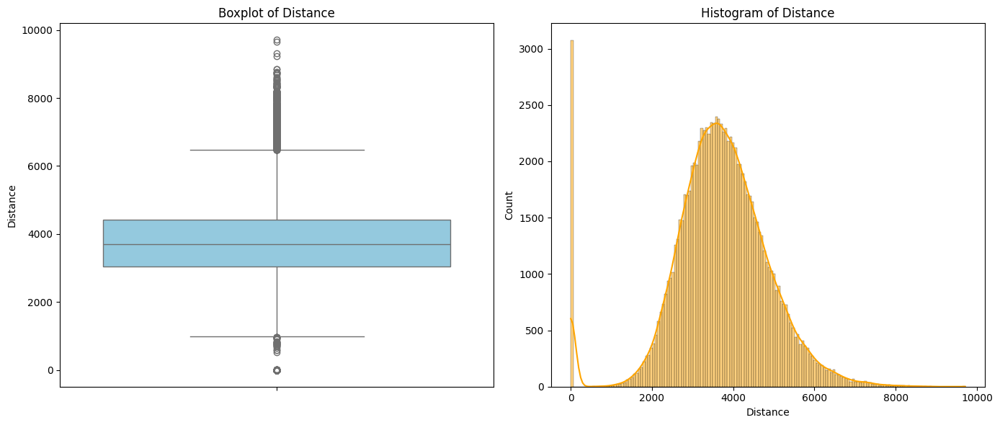

In [26]:
# Фильтруем аномальные значения
df_filtered = df2[df2['Distance'] < 2000000]

# Создаем графики в одном месте
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot (вертикальный)
sns.boxplot(y=df_filtered['Distance'], ax=axes[0], color='skyblue')
axes[0].set_title('Boxplot of Distance')

# Histplot
sns.histplot(df_filtered['Distance'], kde=True, ax=axes[1], color='orange')
axes[1].set_title('Histogram of Distance')

plt.tight_layout()
plt.show()


In [30]:
gap = df2['Distance'][df2['Distance'] > 3000000].count()
df2 = df2[df2['Speed (km/h)'] <= 50]
df2 = df2[df2['Distance'] <= 10000]
df2

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo,Start Month,End Month,Start Season,End Season,Time start,Time end,Trip Duration,Speed (km/h)
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Ул. Шевченко,Юго-восточный,Ул. Майская,Октябрьский,4069.0,0,4,4.0,Весна,Весна,09:01:03,09:24:45,23.700000,10.301266
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Ул. Чехова,Заречный,Ул. Спортивная,Октябрьский,4515.0,0,4,4.0,Весна,Весна,09:01:07,09:29:32,28.416667,9.533138
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Ул. Буденного,Октябрьский,Ул. Суворова,Ленинский,4520.0,0,4,4.0,Весна,Весна,09:04:27,09:42:46,38.316667,7.077860
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Ул. Труда,Центральный,Ул. Рабочая,Северо-западный,3881.0,0,4,4.0,Весна,Весна,09:06:34,09:38:23,31.816667,7.318806
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Ул. Первомайская,Северо-западный,Ул. Юбилейная,Юго-восточный,4029.0,0,4,4.0,Весна,Весна,09:09:27,09:40:07,30.666667,7.882826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,Ул. Озерная,Юго-восточный,Ул. Первомайская,Северо-западный,3302.0,0,7,8.0,Лето,Лето,23:45:06,00:06:55,21.816667,9.081131
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,Ул. Мичурина,Ленинский,Ул. Садовая,Заречный,4992.0,0,7,8.0,Лето,Лето,23:46:01,00:25:35,39.566667,7.570008
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,Ул. Лермонтова,Ленинский,Ул. Куйбышева,Центральный,2781.0,0,7,8.0,Лето,Лето,23:48:04,00:09:21,21.283333,7.839937
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,Ул. Рябиновая,Северо-западный,Ул. Энергетиков,Юго-восточный,6466.0,0,7,8.0,Лето,Лето,23:51:41,00:38:04,46.383333,8.364211


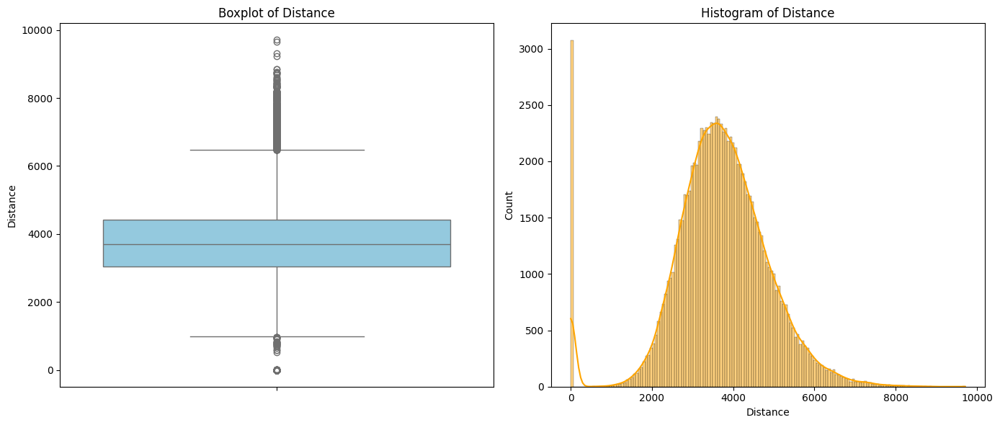

In [32]:
df_filtered = df2[df2['Distance'] < 2000000]

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(y=df_filtered['Distance'], ax=axes[0], color='skyblue')
axes[0].set_title('Boxplot of Distance')

sns.histplot(df_filtered['Distance'], kde=True, ax=axes[1], color='orange')
axes[1].set_title('Histogram of Distance')

plt.tight_layout()
plt.show()

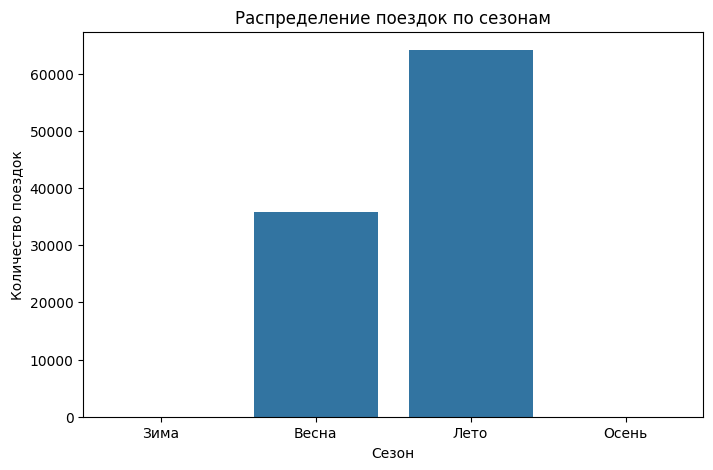

In [34]:
plt.figure(figsize=(8, 5))
sns.countplot(x='Start Season', data=df2, order=['Зима', 'Весна', 'Лето', 'Осень'])
plt.title('Распределение поездок по сезонам')
plt.xlabel('Сезон')
plt.ylabel('Количество поездок')
plt.show()

In [44]:
season_mapping = {"Весна": 1, "Лето": 2, "Осень": 3, "Зима": 4}
df22= df2.copy()
df22["Season_Num"] = df22["Start Season"].map(season_mapping)

correlation = df22["Trip Duration"].corr(df22["Season_Num"]) #пирсон
correlation1 = df22["Distance"].corr(df22["Season_Num"])

print(f"Корреляция между длительностью поездки и временем года: {correlation:.4f}")
print(f"Корреляция между длиной поездки и временем года: {correlation1:.4f}")

Корреляция между длительностью поездки и временем года: -0.0010
Корреляция между длиной поездки и временем года: -0.0009


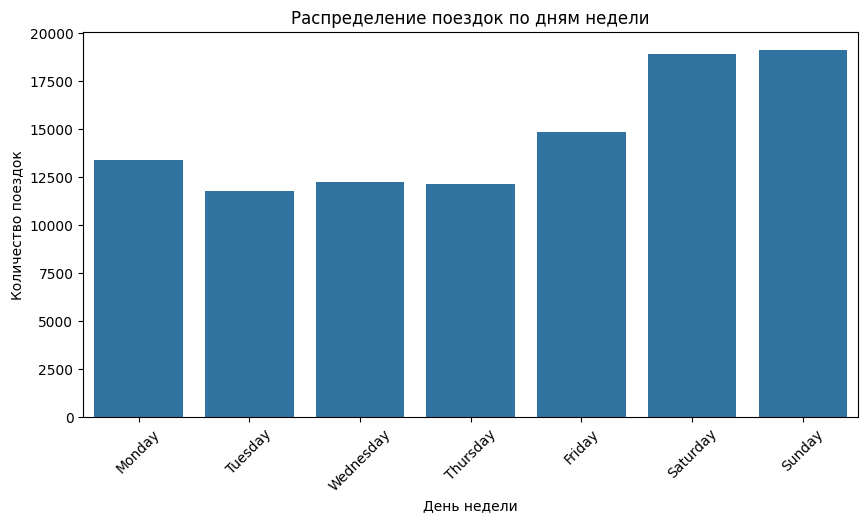

In [42]:
df["Start Date"] = pd.to_datetime(df["Start Date"])

# Добавляем колонку с днем недели
df["Day of Week"] = df["Start Date"].dt.day_name()

# Строим график
plt.figure(figsize=(10, 5))
sns.countplot(x=df["Day of Week"], order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.xticks(rotation=45)
plt.xlabel("День недели")
plt.ylabel("Количество поездок")
plt.title("Распределение поездок по дням недели")
plt.show()

In [ ]:
df2["Time start"] = pd.to_datetime(df2["Time start"], format="%H:%M:%S").dt.time

# Функция для распределения времени суток
def get_time_of_day(time):
    if time >= pd.to_datetime("06:00:00").time() and time < pd.to_datetime("12:00:00").time():
        return "Утро"
    elif time >= pd.to_datetime("12:00:00").time() and time < pd.to_datetime("18:00:00").time():
        return "День"
    elif time >= pd.to_datetime("18:00:00").time() and time < pd.to_datetime("00:00:00").time():
        return "Вечер"
    else:
        return "Ночь"

# Создаем новую колонку
df2["Time of Day"] = df2["Time start"].apply(get_time_of_day)

# Выведем первые 5 строк, чтобы проверить результат
print(df2[["Time start", "Time of Day"]].head())
df2

In [98]:
df_w = pd.read_csv(PATH_OUT + '\\weather.csv', sep=',', encoding='utf-8', skipinitialspace=True, decimal=',')
df_w

,Datetime,Temperature,Precipitation Total,Wind Gust,Wind Speed,Cloud Cover Total,Sunshine Duration
0,NaN,°C,mm,km/h,km/h,%,min
1,2023-04-01T00:00:00,8.740245,0.1,48.6,21.638964,90,0
2,2023-04-01T01:00:00,9.040245,0.2,55.44,22.493519,74,0
3,2023-04-01T02:00:00,8.880245,0.3,55.8,22.26477,72,0
4,2023-04-01T03:00:00,8.690246,0.3,55.44,21.94524,77,0
...,...,...,...,...,...,...,...
3668,2023-08-31T19:00:00,16.940245,0,10.799999,1.08,89,1.4999998
3669,2023-08-31T20:00:00,16.630245,0,11.159999,1.1384199,83,0
3670,2023-08-31T21:00:00,17.080246,0.1,17.64,3.396233,82,0
3671,2023-08-31T22:00:00,17.180244,0,21.599998,7.2359104,80,0


In [108]:
df_w.drop(0, inplace=True)
df_w['Datetime'] = pd.to_datetime(df_w['Datetime']) 
df_w['Day'] = df_w['Datetime'].dt.day  
df_w['Month'] =df_w['Datetime'].dt.month  
df_w['Time'] = df_w['Datetime'].dt.time
df_w

,Datetime,Temperature,Precipitation Total,Wind Gust,Wind Speed,Cloud Cover Total,Sunshine Duration,Day,Month,Time
1,2023-04-01 00:00:00,8.740245,0.1,48.6,21.638964,90,0,1,4,00:00:00
2,2023-04-01 01:00:00,9.040245,0.2,55.44,22.493519,74,0,1,4,01:00:00
3,2023-04-01 02:00:00,8.880245,0.3,55.8,22.26477,72,0,1,4,02:00:00
4,2023-04-01 03:00:00,8.690246,0.3,55.44,21.94524,77,0,1,4,03:00:00
5,2023-04-01 04:00:00,8.630245,0.3,48.96,22.42427,78,0,1,4,04:00:00
...,...,...,...,...,...,...,...,...,...,...
3668,2023-08-31 19:00:00,16.940245,0,10.799999,1.08,89,1.4999998,31,8,19:00:00
3669,2023-08-31 20:00:00,16.630245,0,11.159999,1.1384199,83,0,31,8,20:00:00
3670,2023-08-31 21:00:00,17.080246,0.1,17.64,3.396233,82,0,31,8,21:00:00
3671,2023-08-31 22:00:00,17.180244,0,21.599998,7.2359104,80,0,31,8,22:00:00


In [54]:
seasons = {
    12: 'Зима', 1: 'Зима', 2: 'Зима',
    3: 'Весна', 4: 'Весна', 5: 'Весна',
    6: 'Лето', 7: 'Лето', 8: 'Лето',
    9: 'Осень', 10: 'Осень', 11: 'Осень'
}
df_w['Season'] = df_w['Month'].map(seasons)
df_w

NameError: name 'df_w' is not defined

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

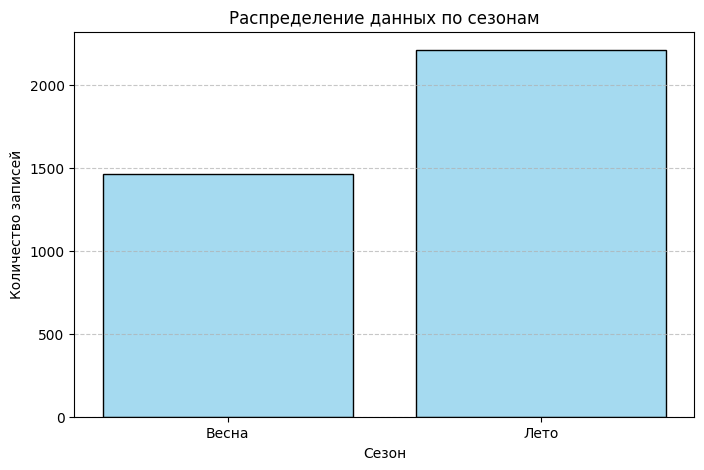

In [116]:
plt.figure(figsize=(8, 5))
sns.histplot(df_w, x="Season", discrete=True, shrink=0.8, color="skyblue")

plt.xlabel("Сезон")
plt.ylabel("Количество записей")
plt.title("Распределение данных по сезонам")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
df2['Start District'] = df2['Start District'].str.replace('Северо Западный', 'Северо-западный')
df2['End District'] = df2['End District'].str.replace('Северо Западный', 'Северо-западный')


In [ ]:
# Получаем все уникальные районы из обоих столбцов
all_districts = pd.concat([
    df['Start District'], 
    df['End District']
]).unique()

# Сортируем районы по алфавиту
sorted_districts = sorted(all_districts)

In [ ]:
# Создаем DataFrame с уникальными районами
districts_df = pd.DataFrame({'District': sorted_districts})

# Добавляем статистику по каждому району
districts_df['Start Count'] = districts_df['District'].apply(
    lambda x: df2[df2['Start District'] == x].shape[0])
districts_df['End Count'] = districts_df['District'].apply(
    lambda x: df2[df2['End District'] == x].shape[0])
districts_df['Total Trips'] = districts_df['Start Count'] + districts_df['End Count']

# Сортируем по количеству поездок
districts_df = districts_df.sort_values('Total Trips', ascending=False)

print(districts_df)

In [89]:
correlations_by_start_district = df2.groupby('Start District').apply(
    lambda x: x['Trip Duration'].corr(x['Distance'])
)
print(correlations_by_start_district)


Start District
Заречный           0.567805
Ленинский          0.587329
Октябрьский        0.522128
Северо-западный    0.597246
Центральный        0.541846
Юго-восточный      0.608538
dtype: float64


C:\Temp\ipykernel_2148\3020272985.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlations_by_start_district = df2.groupby('Start District').apply(


In [60]:
rate_per_minute = 9
# Выделим день недели и час начала
df2['Weekday'] = df2['Start Date'].dt.weekday  # Понедельник = 0
df2['Start Hour'] = df2['Start Date'].dt.hour

# Условие: если понедельник, 6–9 часов включительно, и есть промо
condition_free_start = (
    (df2['Weekday'] == 0) &
    (df2['Start Hour'] >= 6) & (df2['Start Hour'] < 10) &
    (df2['Promo'] == 1)
)

# Применяем расчет стоимости
df2['Trip Cost'] = df2['Trip Duration'] * rate_per_minute  # без старта
df2.loc[~condition_free_start, 'Trip Cost'] += 30  # если не попадает под акцию, добавляем 30₽
df2

,Id,Start Date,End Date,Start Location,Start District,End Location,End District,Distance,Promo,Start Month,...,Start Season,End Season,Time start,Time end,Trip Duration,Speed (km/h),Time of Day,Weekday,Start Hour,Trip Cost
0,100340,2023-04-22 09:01:03,2023-04-22 09:24:45,Ул. Шевченко,Юго-восточный,Ул. Майская,Октябрьский,4069.0,0,4,...,Весна,Весна,09:01:03,09:24:45,23.700000,10.301266,Утро,5,9,243.30
1,100341,2023-04-22 09:01:07,2023-04-22 09:29:32,Ул. Чехова,Заречный,Ул. Спортивная,Октябрьский,4515.0,0,4,...,Весна,Весна,09:01:07,09:29:32,28.416667,9.533138,Утро,5,9,285.75
2,100342,2023-04-22 09:04:27,2023-04-22 09:42:46,Ул. Буденного,Октябрьский,Ул. Суворова,Ленинский,4520.0,0,4,...,Весна,Весна,09:04:27,09:42:46,38.316667,7.077860,Утро,5,9,374.85
3,100343,2023-04-22 09:06:34,2023-04-22 09:38:23,Ул. Труда,Центральный,Ул. Рабочая,Северо-западный,3881.0,0,4,...,Весна,Весна,09:06:34,09:38:23,31.816667,7.318806,Утро,5,9,316.35
4,100344,2023-04-22 09:09:27,2023-04-22 09:40:07,Ул. Первомайская,Северо-западный,Ул. Юбилейная,Юго-восточный,4029.0,0,4,...,Весна,Весна,09:09:27,09:40:07,30.666667,7.882826,Утро,5,9,306.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102250,197707,2023-07-31 23:45:06,2023-08-01 00:06:55,Ул. Озерная,Юго-восточный,Ул. Первомайская,Северо-западный,3302.0,0,7,...,Лето,Лето,23:45:06,00:06:55,21.816667,9.081131,Ночь,0,23,226.35
102251,197708,2023-07-31 23:46:01,2023-08-01 00:25:35,Ул. Мичурина,Ленинский,Ул. Садовая,Заречный,4992.0,0,7,...,Лето,Лето,23:46:01,00:25:35,39.566667,7.570008,Ночь,0,23,386.10
102252,197709,2023-07-31 23:48:04,2023-08-01 00:09:21,Ул. Лермонтова,Ленинский,Ул. Куйбышева,Центральный,2781.0,0,7,...,Лето,Лето,23:48:04,00:09:21,21.283333,7.839937,Ночь,0,23,221.55
102253,197710,2023-07-31 23:51:41,2023-08-01 00:38:04,Ул. Рябиновая,Северо-западный,Ул. Энергетиков,Юго-восточный,6466.0,0,7,...,Лето,Лето,23:51:41,00:38:04,46.383333,8.364211,Ночь,0,23,447.45


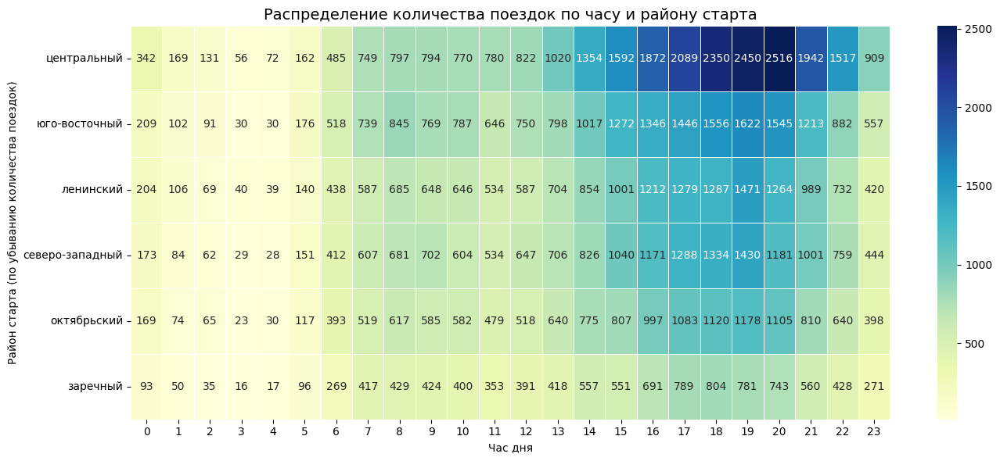

In [72]:
# Считаем общее количество поездок в каждом районе
district_order = df2['Start District'].value_counts().index.tolist()
# Преобразуем в формат таблицы
pivot_table = grouped.pivot(index='Start District', columns='Start Hour', values='Trip Count').fillna(0)

# Сортируем индексы по district_order
pivot_table = pivot_table.reindex(district_order)

# Строим график
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".0f", linewidths=.5)
plt.title("Распределение количества поездок по часу и району старта", fontsize=14)
plt.xlabel("Час дня")
plt.ylabel("Район старта (по убыванию количества поездок)")
plt.tight_layout()
plt.show()

C:\Temp\ipykernel_17436\1772200853.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=district_durations.values, y=district_durations.index, palette="coolwarm")


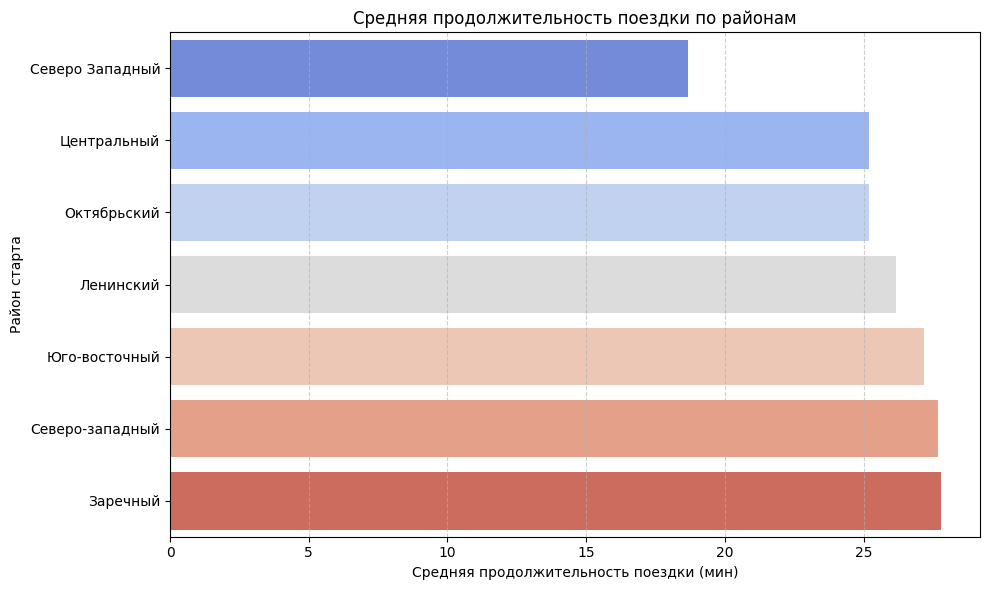

In [62]:
district_durations = df2.groupby("Start District")["Trip Duration"].mean().sort_values()

# Строим график
plt.figure(figsize=(10, 6))
sns.barplot(x=district_durations.values, y=district_durations.index, palette="coolwarm")
plt.xlabel("Средняя продолжительность поездки (мин)")
plt.ylabel("Район старта")
plt.title("Средняя продолжительность поездки по районам")
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [75]:
profile = ProfileReport(
    df1, 
    title="Profiling Report", 
    correlations={
        "auto": {"calculate": False},
        "pearson": {"calculate": True},
        "spearman": {"calculate": True},
        "kendall": {"calculate": True},
        "phi_k": {"calculate": True},
        "cramers": {"calculate": True}
    }
)

In [81]:
profile